# Analyzing COVID-19 Impact: Did Vaccination Affect Elderly Mortality in US?

- `Objective:` analyzing if COVID-19 vax affected elderly mortality.
- `Source:` data.CMS.gov.
- `Data:` COVID-19 reports from nursing homes to CDC's NHSN COVID-19 Facility Module.
- `Volume:` over 2.5 million data points.
- `Coverage:` multiple nursing homes across U.S. states and some islands.
- `Period:` May 24, 2020, to August 27, 2023.

## Data Investigation

In [54]:
# Basic imports related to data cleaning, wrangling and analysis
import pandas as pd
import numpy as np
from scipy import stats

# Imports related to visualisation
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import matplotlib.colors as mcolors

pd.options.display.max_columns = 40

In [55]:
df = pd.read_csv("./data/COVID_19_Nursing_Home_Data_08_27_2023.zip", low_memory=False)

In [56]:
df.head()

,Week Ending,Federal Provider Number,Provider Name,Provider Address,Provider City,Provider State,Provider Zip Code,Provider Phone Number,County,Submitted Data,Passed Quality Assurance Check,Residents Weekly Confirmed COVID-19,Residents Total Confirmed COVID-19,Residents Weekly All Deaths,Residents Total All Deaths,Residents Weekly COVID-19 Deaths,Residents Total COVID-19 Deaths,Number of All Beds,Total Number of Occupied Beds,Residents Hospitalizations with Confirmed COVID-19,Residents Hospitalizations with Confirmed COVID-19 and Up to Date with Vaccines,Staff Weekly Confirmed COVID-19,Staff Total Confirmed COVID-19,"Weekly Resident Confirmed COVID-19 Cases Per 1,000 Residents","Weekly Resident COVID-19 Deaths Per 1,000 Residents","Total Resident Confirmed COVID-19 Cases Per 1,000 Residents","Total Resident COVID-19 Deaths Per 1,000 Residents","Number of Residents who are Up to Date on COVID-19 Vaccinations, 14 Days or More Before Positive Test",Number of Residents Staying in this Facility for At Least 1 Day This Week,Number of All Healthcare Personnel Eligible to Work in this Facility for At Least 1 Day This Week,Number of All Healthcare Personnel Eligible to Work in this Facility for At Least 1 Day This Week who Received a Completed COVID-19 Vaccination at Any Time,Recent Percentage of Current Healthcare Personnel who Received a Completed COVID-19 Vaccination at Any Time,Percentage of Current Healthcare Personnel who Received a Completed COVID-19 Vaccination at Any Time,Number of Residents Staying in this Facility for At Least 1 Day This Week Up to Date with COVID-19 Vaccines,Recent Percentage of Current Residents Up to Date with COVID-19 Vaccines,Percentage of Current Residents Up to Date with COVID-19 Vaccines,Number of Healthcare Personnel Eligible to Work in this Facility for At Least 1 Day This Week Up to Date with COVID-19 Vaccines,Recent Percentage of Current Healthcare Personnel Up to Date with COVID-19 Vaccines,Percentage of Current Healthcare Personnel Up to Date with COVID-19 Vaccines
0,2020-05-24,015009,"BURNS NURSING HOME, INC.",701 MONROE STREET NW,RUSSELLVILLE,AL,35653,2563324110,Franklin,Y,Y,45.0,45.0,4.0,4.0,4.0,4.0,57.0,45.0,0.0,0.0,33.0,33.0,1000.0,88.89,1000.00,88.89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-05-31,015009,"BURNS NURSING HOME, INC.",701 MONROE STREET NW,RUSSELLVILLE,AL,35653,2563324110,Franklin,Y,Y,0.0,45.0,0.0,4.0,0.0,4.0,57.0,42.0,0.0,0.0,2.0,35.0,0.0,0.00,1071.43,95.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-06-07,015009,"BURNS NURSING HOME, INC.",701 MONROE STREET NW,RUSSELLVILLE,AL,35653,2563324110,Franklin,Y,Y,0.0,45.0,0.0,4.0,0.0,4.0,57.0,43.0,0.0,0.0,0.0,35.0,0.0,0.00,1046.51,93.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-06-14,015009,"BURNS NURSING HOME, INC.",701 MONROE STREET NW,RUSSELLVILLE,AL,35653,2563324110,Franklin,Y,Y,0.0,45.0,0.0,4.0,0.0,4.0,57.0,43.0,0.0,0.0,0.0,35.0,0.0,0.00,1046.51,93.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-06-21,015009,"BURNS NURSING HOME, INC.",701 MONROE STREET NW,RUSSELLVILLE,AL,35653,2563324110,Franklin,Y,Y,0.0,45.0,0.0,4.0,0.0,4.0,57.0,45.0,0.0,0.0,0.0,35.0,0.0,0.00,1000.00,88.89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We are going to read right away the second df which contains population by state and is used in visualisation by state.

In [57]:
states_pop = pd.read_csv('./data/states.csv')
states_pop.head()

,State,2022-07-01,2020-04-01
0,California,39029342,39538223
1,Texas,30029572,29145505
2,Florida,22244823,21538187
3,New York,19677151,20201249
4,Pennsylvania,12972008,13002700


We are going to convert `Week Ending` to pandas `datetime`. 

In [58]:
df["Week Ending"] = pd.to_datetime(df["Week Ending"], format="%Y-%m-%d")

We are going to use only the data that passed quality assurance check. Let's see how many data points we have and how many of those that passed QA.  

In [59]:
# All data points
df.shape

(2596199, 39)

In [60]:
# QA passed data points
df = df[df["Passed Quality Assurance Check"] == "Y"].copy()
df.shape

(2566599, 39)

Now let's calculate simple statistics "min", "max", "mean", "sum", "std" for 3 columns: 
- `Residents Weekly All Deaths` as `all_deaths`;
- `Residents Weekly COVID-19 Deaths` as `covid_deaths`;
- `Residents Weekly Confirmed COVID-19` as `conf_cases`.

In [61]:
# Calculate statistics for further plotting
def get_stats(data, columns=None, day=None):
    return (
        data.groupby(by=lambda x: data.loc[x]["Week Ending"].replace(day=day))
        .agg({column: ["min", "max", "mean", "sum", "std"] for column, _ in columns})
        .reset_index()
        .rename(
            columns={column: new_name for column, new_name in columns}
            | {"index": "date"}
        )
    )

In [62]:
# Get statistics for plotting
stats = get_stats(
    df,
    [
        ("Residents Weekly All Deaths", "all_deaths"),
        ("Residents Weekly COVID-19 Deaths", "covid_deaths"),
        ("Residents Weekly Confirmed COVID-19", "conf_cases"),
    ],
)

In [63]:
stats

date all_deaths                                      covid_deaths  \
                      min    max      mean      sum        std          min   
0   2020-05-24        0.0  986.0  5.087590  73709.0  13.940163          0.0   
1   2020-05-31        0.0  168.0  0.703143  10403.0   2.799460          0.0   
2   2020-06-07        0.0  180.0  0.634555   9571.0   3.436021          0.0   
3   2020-06-14        0.0  195.0  0.579145   8781.0   2.961859          0.0   
4   2020-06-21        0.0  205.0  0.546185   8290.0   2.687596          0.0   
..         ...        ...    ...       ...      ...        ...          ...   
166 2023-07-30        0.0   46.0  0.306009   4476.0   0.749324          0.0   
167 2023-08-06        0.0   25.0  0.314667   4619.0   0.702494          0.0   
168 2023-08-13        0.0   25.0  0.327518   4806.0   0.712075          0.0   
169 2023-08-20        0.0   25.0  0.328302   4785.0   0.728852          0.0   
170 2023-08-27        0.0    8.0  0.311161   4271.0   0.670808          0.0   

                                       conf_cases                            \
      max      mean      sum       std        min    max      mean      sum   
0    89.0  1.781957  25817.0  5.664696        0.0  312.0  6.380660  92443.0   
1    27.0  0.238189   3524.0  1.082654        0.0  119.0  0.759311  11234.0   
2    66.0  0.184446   2782.0  1.109771        0.0  112.0  0.629981   9502.0   
3    40.0  0.135800   2059.0  0.806174        0.0   84.0  0.465968   7065.0   
4    22.0  0.113585   1724.0  0.652221        0.0   73.0  0.424957   6450.0   
..    ...       ...      ...       ...        ...    ...       ...      ...   
166   3.0  0.004786     70.0  0.077419        0.0   41.0  0.298557   4367.0   
167   3.0  0.006744     99.0  0.091293        0.0   53.0  0.388787   5707.0   
168   4.0  0.006815    100.0  0.095320        0.0   99.0  0.476353   6990.0   
169   3.0  0.007753    113.0  0.094491        0.0   51.0  0.594991   8672.0   
170   3.0  0.009107    125.0  0.104493        0.0   56.0  0.659187   9048.0   

                
           std  
0    17.886726  
1     3.788175  
2     3.447120  
3     2.559147  
4     2.445950  
..         ...  
166   1.774810  
167   2.084504  
168   2.394795  
169   2.508668  
170   2.593135  

[171 rows x 16 columns]

In [64]:
# Check for duplicates
duplicates = stats.loc[df.duplicated(keep='first')]
duplicates

Empty DataFrame
Columns: [(date, ), (all_deaths, min), (all_deaths, max), (all_deaths, mean), (all_deaths, sum), (all_deaths, std), (covid_deaths, min), (covid_deaths, max), (covid_deaths, mean), (covid_deaths, sum), (covid_deaths, std), (conf_cases, min), (conf_cases, max), (conf_cases, mean), (conf_cases, sum), (conf_cases, std)]
Index: []

## Statistics Visualisation 

In [65]:
# remove black frames from plots
sns.despine(trim=True, right=True)

# Set style to 'darkgrid'
sns.set(style="darkgrid")

# Clear Matplotlib cache and save the plot in high resolution 
plt.rcParams.update({'figure.dpi': 600})
plt.savefig('output_figure.png')

<Figure size 3840x2880 with 0 Axes>

In [66]:
def plot_deaths(stats):
    # Set up grid with 1 row and 2 columns
    fig, ax = plt.subplots(2, 1, figsize=(20, 9))


    def plot_stats(data, var, color, ax=None, label=None):
        # Pass data to the statistics plot
        plot_line = sns.lineplot(
            x=stats["date"], y=stats.loc[:, (var, "mean")], color=color, label=label, ax=ax
        )

        # Fill the space between statistics with color
        plot_line.fill_between(
            data["date"],
            data.loc[:, (var, "min")],
            data.loc[:, (var, "max")],
            alpha=0.3,
            color=color,
        )
        return plot_line


    def plot_mean(data, var, color, ax=None, label=None):
        # Pass data to the means plot
        plot_line = sns.lineplot(
            x=data["date"], y=data.loc[:, (var, "mean")], color=color, label=label, ax=ax
        )

        # Fill the space between means and x-axis
        ax.fill_between(
            data["date"],
            0,  # y1 = 0
            data.loc[:, (var, "mean")],  # y2 = mean
            facecolor=color,
            color=color,
            alpha=0.1,
        )


    def plot_sums(data, var, color, ax=None, label=None):
        # Pass data to the sums plot
        plot_line = sns.lineplot(
            x=data["date"], y=data.loc[:, (var, "sum")], color=color, label=label, ax=ax
        )


    # Pass data for the plots
    plot_stats(stats, var="all_deaths", color="grey", label="All Deaths", ax=ax[0])
    plot_stats(stats, var="covid_deaths", color="blue", label="COVID-19 Deaths", ax=ax[0])
    plot_stats(stats, var='conf_cases', color='orange', label='Confirmed COVID-19 Cases', ax=ax[0])


    plot_mean(stats, var="all_deaths", color="grey", ax=ax[1])
    plot_mean(stats, var="covid_deaths", color="blue", ax=ax[1])
    plot_mean(stats, var='conf_cases', color='orange', ax=ax[1])

    ax_twin = ax[1].twinx()
    plot_sums(stats, var="all_deaths", color="grey", ax=ax_twin)
    plot_sums(stats, var="covid_deaths", color="blue", ax=ax_twin)
    plot_sums(stats, var='conf_cases', color='orange', ax=ax_twin)

    # Set up plots limits
    start_end = [stats["date"].min(), stats["date"].max()]
    ax[0].set_xlim(start_end)
    ax[1].set_xlim(start_end)
    ax_twin.set_xlim(start_end)

    # Customize titles for each subplot
    ax[0].set_title("Maximums", fontsize=20)
    ax[1].set_title("Means and Sums", fontsize=20)

    ax[0].set_ylabel("Maximums", fontsize=16)
    ax[1].set_ylabel("Means", fontsize=16)
    ax_twin.set_ylabel("Sums", fontsize=16)

    ax[0].set(xlabel=None)
    ax[1].set(xlabel=None)

    # Add legend to the 1st plot
    ax[0].legend(fontsize=16)
    # Remove legends from the second and third plots
    ax[1].legend([])
    ax_twin.legend([])

    # Increase the tick label font size
    for axis in list(ax) + [ax_twin]:
        axis.tick_params(axis="both", labelsize="large")

    fig.tight_layout()

    # Show the plot
    plt.show()

In [67]:
plot_deaths(stats)

On the graphs we are going to remove first week from the `stats`, because it looks like they have put all values that accumulated till that point in time and it will skew our visualisations too much.

In [68]:
# Remove first week from the whole df
df = df[df['Week Ending'] > '2020-05-24'].copy()

In [69]:
# Get statistics for plotting
stats = get_stats(
    df,
    [
        ("Residents Weekly All Deaths", "all_deaths"),
        ("Residents Weekly COVID-19 Deaths", "covid_deaths"),
        ("Residents Weekly Confirmed COVID-19", "conf_cases"),
    ],
).copy()

In [70]:
plot_deaths(stats)

### Result 

Considering that:

- Maximums provide valuable insights into the upper bounds of data distributions
- Means provide insight into the typical value or central tendency of the dataset.
- Sums indicate the cumulative magnitude or total of all values in the dataset.


- We can clearly see that from **2020-06** till **2021-02** the maximums of `Residents Weekly All Deaths` and `Residents Weekly Confirmed COVID-19` are very high. `Residents Weekly COVID-19 Deaths` is a lower in relation to the these two, but significantly higher than weeks after. Which means that maximum number of deaths in these days were a lot higher, than normal, but only a part of deaths was attributed to COVID-19 by medics.  

- Means and Sums look on this very similar on this particular graph, although they looked a bit different on the graph with outliers. Essentially they show two peaks in **2021-12** and **2021-02** - these could coincide with emergence of the new strains of COVID-19. We see that the second peak has less death toll that the previous one. Could it be because of vaccinations? 

- A period of general increase in the `Residents Weekly Confirmed COVID-19` starts from **2022-05** and lasts up until **2022-05**. Again could be the new strain of COVID-19, but even less lethal for elderly.  


Now let's calculate sum of: 
- `Residents Weekly COVID-19 Deaths`;
- `Residents Weekly Confirmed COVID-19`;
- `Residents Weekly All Deaths`
- `Percentage of Current Residents Up to Date with COVID-19 Vaccines`. 

And put it all on a graph for comparison. 

In [36]:
def custom_sum(data, column):
    # Group the data by 'Week Ending' and calculate the sum for each week
    weekly_sum = pd.DataFrame(data.groupby('Week Ending')[column].sum()).reset_index()
    return weekly_sum

In [41]:
# Calculate the custom sum for the 'Residents Weekly COVID-19 Deaths' column
custom_sum_deaths = custom_sum(df, 'Residents Weekly COVID-19 Deaths')
custom_sum_deaths


,Week Ending,Residents Weekly COVID-19 Deaths
0,2020-05-31,3524.0
1,2020-06-07,2782.0
2,2020-06-14,2059.0
3,2020-06-21,1724.0
4,2020-06-28,1448.0
...,...,...
165,2023-07-30,70.0
166,2023-08-06,99.0
167,2023-08-13,100.0
168,2023-08-20,113.0


In [42]:
custom_sum_cases = custom_sum(df, 'Residents Weekly Confirmed COVID-19') 
custom_sum_cases

,Week Ending,Residents Weekly Confirmed COVID-19
0,2020-05-31,11234.0
1,2020-06-07,9502.0
2,2020-06-14,7065.0
3,2020-06-21,6450.0
4,2020-06-28,7154.0
...,...,...
165,2023-07-30,4367.0
166,2023-08-06,5707.0
167,2023-08-13,6990.0
168,2023-08-20,8672.0


In [40]:
up_to_date_vac = df.groupby('Week Ending').apply(lambda x: (
    x['Percentage of Current Residents Up to Date with COVID-19 Vaccines'] / 100 * x['Total Number of Occupied Beds']
            ).sum() / x['Total Number of Occupied Beds'].sum() * 100).reset_index(
                name='Percentage of Current Residents Up to Date with COVID-19 Vaccines'
                )
up_to_date_vac

,Week Ending,Percentage of Current Residents Up to Date with COVID-19 Vaccines
0,2020-05-31,0.000000
1,2020-06-07,0.000000
2,2020-06-14,0.000000
3,2020-06-21,0.000000
4,2020-06-28,0.000000
...,...,...
165,2023-07-30,61.909624
166,2023-08-06,62.285563
167,2023-08-13,62.086438
168,2023-08-20,61.463633


In [43]:
all_deaths = custom_sum(df, 'Residents Weekly All Deaths')
all_deaths

,Week Ending,Residents Weekly All Deaths
0,2020-05-31,10403.0
1,2020-06-07,9571.0
2,2020-06-14,8781.0
3,2020-06-21,8290.0
4,2020-06-28,8005.0
...,...,...
165,2023-07-30,4476.0
166,2023-08-06,4619.0
167,2023-08-13,4806.0
168,2023-08-20,4785.0


In [44]:
def plot_line(data, column, color, ax=None, label=None):
    plot_line = sns.lineplot(data, x='Week Ending', y=column, color=color, ax=ax, label=label)
    ax.fill_between(
            x=custom_sum_deaths['Week Ending'],
            y1=0,  # y1 = 0
            y2=data[column],  # y2 = variable value
            facecolor=color,
            color=color,
            alpha=0.1)

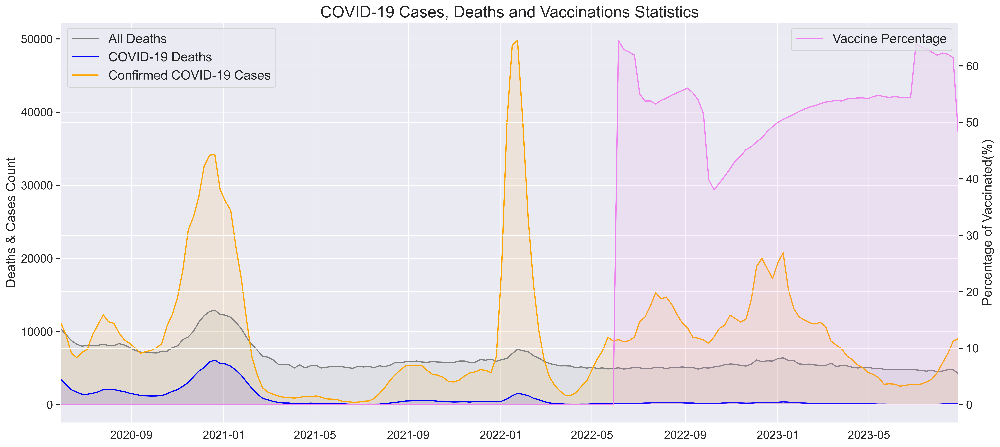

In [45]:
fig, ax = plt.subplots(1, 1, figsize=(20, 9))

plot_line(all_deaths, column='Residents Weekly All Deaths', color='grey', ax=ax, label='All Deaths')
plot_line(custom_sum_deaths, column='Residents Weekly COVID-19 Deaths', color='blue', ax=ax, label='COVID-19 Deaths')
plot_line(custom_sum_cases, column='Residents Weekly Confirmed COVID-19', color='orange', ax=ax, label='Confirmed COVID-19 Cases')
ax_twin = ax.twinx()
plot_line(up_to_date_vac, column='Percentage of Current Residents Up to Date with COVID-19 Vaccines', color='violet',  ax=ax_twin, label='Vaccine Percentage')

# Set up plots limits
start_end = [df["Week Ending"].min(), df["Week Ending"].max()]
ax.set_xlim(start_end)
ax_twin.set_xlim(start_end)

# Add labels and title with increased font sizes
ax.set_xlabel(None)
ax.set_ylabel("Deaths & Cases Count", fontsize=16)
ax_twin.set_ylabel("Percentage of Vaccinated(%)", fontsize=16)

# Add title 
plt.title("COVID-19 Cases, Deaths and Vaccinations Statistics", fontsize=20)

# Add legend
ax.legend(loc='upper left', fontsize=16)
ax_twin.legend(loc='upper right', fontsize=16)

# Increase the tick label font size
ax.tick_params(axis="both", labelsize="large")
ax_twin.tick_params(labelsize="large")

plt.show()

### Results

- We can again see our two peaks in **2021-12** and **2021-02**, but right after the second one nursing homes abruptly start vaccinating residents. 
- During vaccination period the number of `Residents Weekly COVID-19 Deaths` drops and stays very low, even when number of `Residents Weekly Confirmed COVID-19` cases goes higher, compared to the levels before vaccination. 
- We can see that even `Residents Weekly All Deaths` has a clear declining tendency. 


But let's conduct a statistical T-test to make sure what we are seeing is statistically significant. 

## Visualisation by States

Let's visualise COVID-19 Related Deaths by State and COVID-19 Deaths Relative to Population Size by State

In [112]:
def translate_geometries(df, x, y, scale, rotate):
    df.loc[:, "geometry"] = df.geometry.translate(yoff=y, xoff=x)
    center = df.dissolve().centroid.iloc[0]
    df.loc[:, "geometry"] = df.geometry.scale(xfact=scale, yfact=scale, origin=center)
    df.loc[:, "geometry"] = df.geometry.rotate(rotate, origin=center)
    return df


def adjust_maps(df):
    df_main_land = df[~df.STATEFP.isin(["02", "15"])]
    df_alaska = df[df.STATEFP == "02"]
    df_hawaii = df[df.STATEFP == "15"]

    df_alaska = translate_geometries(df_alaska, 1300000, -4900000, 0.5, 32)
    df_hawaii = translate_geometries(df_hawaii, 5400000, -1500000, 1, 24)

    return pd.concat([df_main_land, df_alaska, df_hawaii])


states = gpd.read_file("./data/cb_2018_us_state_500k.zip")
states = states[~states.STATEFP.isin(["72", "69", "60", "66", "78"])]
states = adjust_maps(states.to_crs("ESRI:102003"))

In [113]:
# Determine the luminance threshold (we can adjust this value)
luminance_threshold = 0.5

# Create a function to determine text color based on luminance
def get_text_color(hex_color):
    rgb_color = mcolors.hex2color(hex_color)
    luminance = 0.2126 * rgb_color[0] + 0.7152 * rgb_color[1] + 0.0722 * rgb_color[2]
    return 'white' if luminance < luminance_threshold else 'black'

C:\Users\Julia\AppData\Local\Temp\ipykernel_23528\71028461.py:21: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(


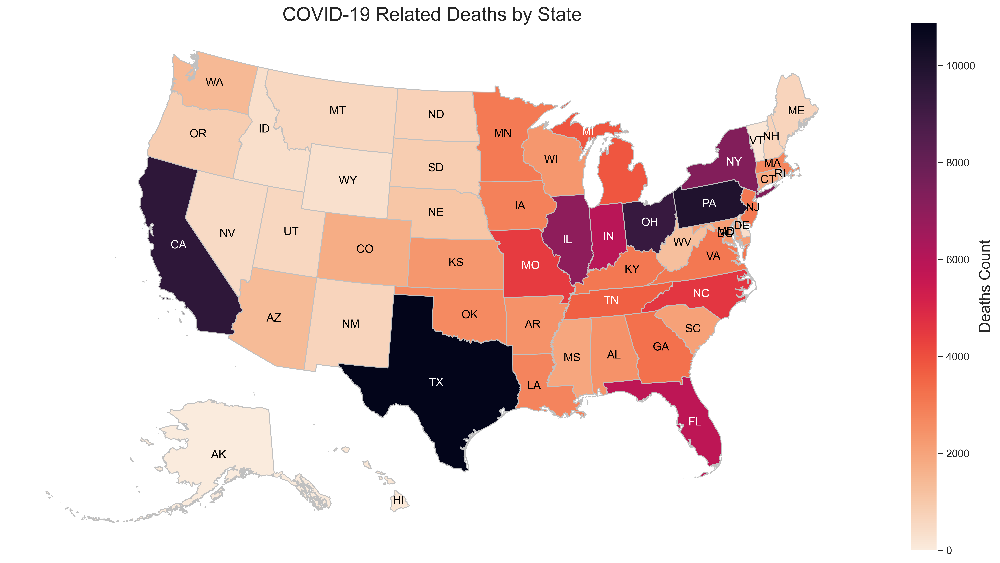

In [114]:
colormap = sns.color_palette("rocket_r", as_cmap=True)

deaths_by_state = (
    df.groupby("Provider State")["Residents Weekly COVID-19 Deaths"].sum().reset_index()
)
min_deaths = deaths_by_state["Residents Weekly COVID-19 Deaths"].min()
max_deaths = deaths_by_state["Residents Weekly COVID-19 Deaths"].max()
deaths_by_state["All Deaths Color"] = deaths_by_state[
    "Residents Weekly COVID-19 Deaths"
].apply(lambda x: colormap(x / max_deaths))

geo_death_states = states.merge(
    right=deaths_by_state, how="left", left_on="STUSPS", right_on="Provider State"
)
geoax = geo_death_states.plot(
    edgecolor="Silver", color=geo_death_states["All Deaths Color"], figsize=(20, 10)
)


plt.axis("off")
cbar = plt.colorbar(
    mpl.cm.ScalarMappable(
        norm=mpl.colors.Normalize(vmin=min_deaths, vmax=max_deaths), cmap=colormap
    )
)

# Set title for the color bar
cbar.set_label("Deaths Count", fontsize=16)

for x, y, label, state_color in zip(
    geo_death_states.geometry.representative_point().x,
    geo_death_states.geometry.representative_point().y,
    geo_death_states["STUSPS"],
    geo_death_states["All Deaths Color"],
):
    text_color = get_text_color(state_color)
    geoax.text(x, y, label, fontsize=12, ha="center", va="center", color=text_color)

# Set plot title
plt.title("COVID-19 Related Deaths by State", fontsize=20)

plt.show()


C:\Users\Julia\AppData\Local\Temp\ipykernel_23528\2027406040.py:27: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(


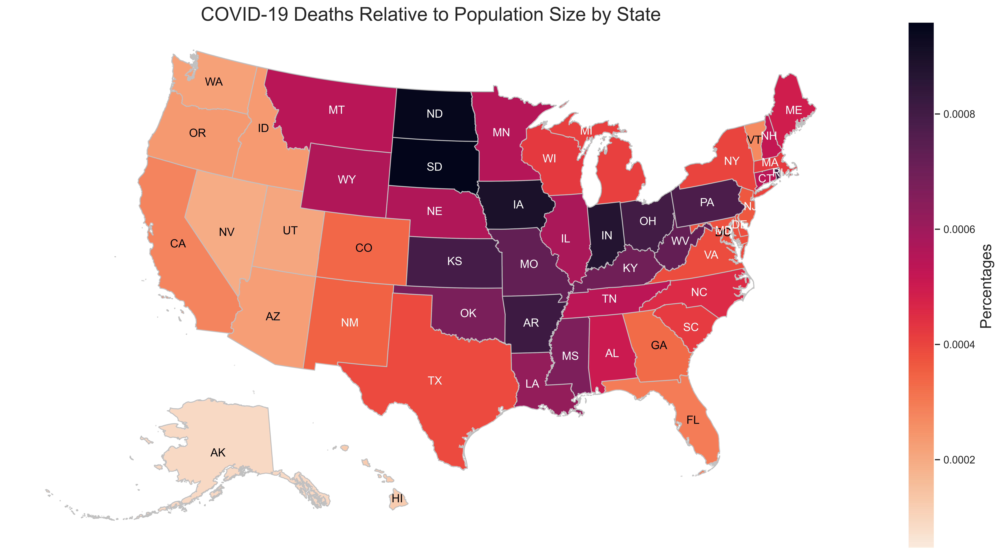

In [115]:
colormap = sns.color_palette("rocket_r", as_cmap=True)

deaths_by_state = (
    df.groupby("Provider State")["Residents Weekly COVID-19 Deaths"].sum().reset_index()
)

geo_death_states = states.merge(
    right=deaths_by_state, how="left", left_on="STUSPS", right_on="Provider State"
).merge(
    right=states_pop, how="left", left_on="NAME", right_on="State"
)
geo_death_states["Deaths by Population"] = geo_death_states[
    "Residents Weekly COVID-19 Deaths"
] / geo_death_states["2022-07-01"]
min_deaths = geo_death_states["Deaths by Population"].min()
max_deaths = geo_death_states["Deaths by Population"].max()
geo_death_states["Deaths by Population Color"] = (geo_death_states[
    "Deaths by Population"
]).apply(lambda x: colormap(x / max_deaths))

geoax = geo_death_states.plot(
    edgecolor="Silver", color=geo_death_states["Deaths by Population Color"], figsize=(20, 10)
)


plt.axis("off")
cbar = plt.colorbar(
    mpl.cm.ScalarMappable(
        norm=mpl.colors.Normalize(vmin=min_deaths, vmax=max_deaths), cmap=colormap
    )
)

# Set title for the color bar
cbar.set_label("Percentages", fontsize=16)

for x, y, label, state_color in zip(
    geo_death_states.geometry.representative_point().x,
    geo_death_states.geometry.representative_point().y,
    geo_death_states["STUSPS"],
    geo_death_states["Deaths by Population Color"],
):
    text_color = get_text_color(state_color)
    geoax.text(x, y, label, fontsize=12, ha="center", va="center", color=text_color)

# Set plot title
plt.title("COVID-19 Deaths Relative to Population Size by State", fontsize=20)

plt.show()


## T-Test 

Let's conduct a t-test to determine whether the number of deaths increased or decreased after nursing homes started vaccination, and if so, by how many standard errors. Additionally, we'll assess whether this shift is statistically significant or not.

We are going to use **Paired/Dependent 2-sample t-test:**, which is used to compare the mean of two samples drawn from the same population where each subject in the sample have been measured twice, before and after vaccination. First we are going to perform two-tails test to understand whether there is a difference in death cases at all. 

Is the difference in all death cases count before and after vaccination? (two tails) <br>
- $H_0: \mu_1 = \mu_2 \longrightarrow there \ is \ \underline{no} \ difference \ in \ the \ number \ of \ death\ cases\ before \ and \ after \ vaccination. $ (The null hypothesis is the default assumption that there is no statistically significant difference between the two groups.)
    
- $H_1: \mu_1 \ne \mu_2 \longrightarrow there \ is \ \underline{a} \ difference \ in \ the \ number \ of \ death\ cases\ before \ and \ after \ vaccination. $

 We are going to use 1% Significance Level (0.01)**:
   - A 1% significance level is one of the most conservative levels. 
   - It's used when researchers want to be very cautious about making Type I errors and are willing to accept a higher risk of Type II errors (failing to detect true effects). 
   - It's appropriate when the consequences of a Type I error are severe or when very strong evidence is required to reject the null hypothesis.

**So if we will have to regect the null hypothesis with this level of significance we can be sure that the difference in the number of death cases before and after vaccination is very significant.** 

We run the test using Dependent t-test  formula:

$$ t = \frac{m}{s \ / \ \sqrt{n}}$$
<br>
1. calculate d: the differences between all pairs (deaths after minus before) <br>
m : mean of distribution <br>
s : standard deviation of distribution <br>
n : number of pairs <br>


We'll need only several columns for the test: 
- `Week Ending`;
- `Percentage of Current Residents Up to Date with COVID-19 Vaccines`;
- `Residents Weekly All Deaths`

In [71]:
slice_vac = df[['Week Ending', 'Percentage of Current Residents Up to Date with COVID-19 Vaccines', 'Residents Weekly All Deaths']]
slice_vac

,Week Ending,Percentage of Current Residents Up to Date with COVID-19 Vaccines,Residents Weekly All Deaths
1,2020-05-31,NaN,0.0
2,2020-06-07,NaN,0.0
3,2020-06-14,NaN,0.0
4,2020-06-21,NaN,0.0
5,2020-06-28,NaN,1.0
...,...,...,...
2596194,2023-07-30,47.297,0.0
2596195,2023-08-06,46.053,0.0
2596196,2023-08-13,49.315,1.0
2596197,2023-08-20,0.000,0.0


### Process NaN

In [72]:
print(slice_vac['Residents Weekly All Deaths'].isna().sum())
slice_vac['Week Ending'].isna().sum()

59


0

There are a lot of data here, so we are going to drop them.

In [73]:
slice_vac.loc[:, 'Week Ending'] = slice_vac['Week Ending'].dropna()

Let's select a slice when residents were not vaccinated. Considering that vaccination on the graph abruptly reached 90% we can conclude that they started vaccination compain when the values in the `Percentage of Current Residents Up to Date with COVID-19 Vaccines` stopped being `NaN`. 


In [100]:
slice_vac_na = slice_vac[pd.isna(slice_vac['Percentage of Current Residents Up to Date with COVID-19 Vaccines'])]
slice_vac_na = slice_vac_na[:-2]
slice_vac_na

,Week Ending,Percentage of Current Residents Up to Date with COVID-19 Vaccines,Residents Weekly All Deaths
1,2020-05-31,NaN,0.0
2,2020-06-07,NaN,0.0
3,2020-06-14,NaN,0.0
4,2020-06-21,NaN,0.0
5,2020-06-28,NaN,1.0
...,...,...,...
2595132,2021-04-25,NaN,0.0
2595133,2021-05-02,NaN,0.0
2595134,2021-05-09,NaN,0.0
2595135,2021-05-16,NaN,0.0


Now we are going to select a slice of the df where `Percentage of Current Residents Up to Date with COVID-19 Vaccines` is not `Nan`.

In [101]:
slice_vac_notna = slice_vac[pd.notna(slice_vac['Percentage of Current Residents Up to Date with COVID-19 Vaccines'])].copy()
slice_vac_notna

,Week Ending,Percentage of Current Residents Up to Date with COVID-19 Vaccines,Residents Weekly All Deaths
53,2021-05-30,0.000,1.0
54,2021-06-06,0.000,0.0
55,2021-06-13,0.000,1.0
56,2021-06-20,0.000,0.0
57,2021-06-27,0.000,0.0
...,...,...,...
2596194,2023-07-30,47.297,0.0
2596195,2023-08-06,46.053,0.0
2596196,2023-08-13,49.315,1.0
2596197,2023-08-20,0.000,0.0


Let's compare their length.

In [102]:
len(slice_vac_notna), len(slice_vac_na)

(1741541, 810568)

Now let's group `Residents Weekly All Deaths` by week before and after vaccination. 

In [104]:
# Number of all deaths groupped by week across the whole country before vaccination
deaths_bef = slice_vac_na[slice_vac_na['Week Ending'] < '2021-05-30'].groupby('Week Ending').sum().drop(columns=['Percentage of Current Residents Up to Date with COVID-19 Vaccines']).reset_index()
deaths_bef

,Week Ending,Residents Weekly All Deaths
0,2020-05-31,10403.0
1,2020-06-07,9571.0
2,2020-06-14,8781.0
3,2020-06-21,8290.0
4,2020-06-28,8005.0
5,2020-07-05,8144.0
6,2020-07-12,8116.0
7,2020-07-19,8123.0
8,2020-07-26,8285.0
9,2020-08-02,8097.0


In [105]:
# Number of all deaths groupped by week across the whole country after vaccination
deaths_aft = slice_vac_notna.groupby('Week Ending').sum().drop(columns=['Percentage of Current Residents Up to Date with COVID-19 Vaccines']).reset_index()[:52]
deaths_aft

,Week Ending,Residents Weekly All Deaths
0,2021-05-30,2719.0
1,2021-06-06,4050.0
2,2021-06-13,4912.0
3,2021-06-20,4920.0
4,2021-06-27,5217.0
5,2021-07-04,5097.0
6,2021-07-11,5193.0
7,2021-07-18,5050.0
8,2021-07-25,5304.0
9,2021-08-01,5196.0


Let's check how it looks on the plot. 

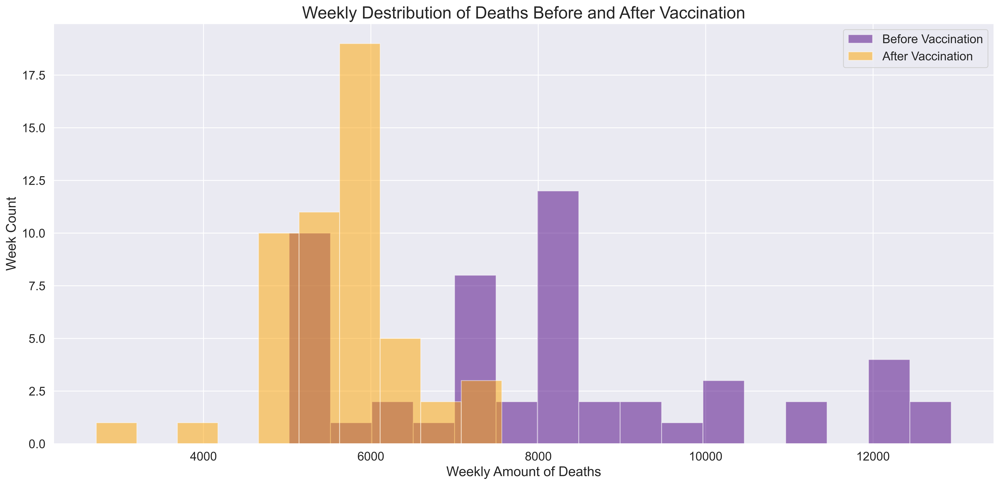

In [106]:
fig, ax = plt.subplots(1, 1, figsize=(20, 9))

plt.hist(deaths_bef['Residents Weekly All Deaths'], alpha=0.5, label='Before Vaccination',  bins=16, color='indigo')
plt.hist(deaths_aft['Residents Weekly All Deaths'], alpha=0.5, label='After Vaccination', bins=10, color='orange')

# Add labels and title with increased font sizes
ax.set_xlabel('Weekly Amount of Deaths', fontsize=16)
ax.set_ylabel("Week Count", fontsize=16)

# Add title with x-large font size
plt.title("Weekly Destribution of Deaths Before and After Vaccination", fontsize=20)

# Add legend
ax.legend(loc='upper right', fontsize="large")

# Increase the tick label font size
ax.tick_params(axis="both", labelsize="large")

plt.show()

We can see the decreased amount of death cases after vaccination campaign has started.

Now to the t-test. 

The t-test calculates a test statistic (tstat) and a p-value. The test statistic represents how many standard errors the sample mean is away from the null hypothesis's expected mean. The p-value tells us the probability of observing such a difference by random chance.


In [107]:
from scipy.stats import ttest_ind
tstat, pval = ttest_ind(deaths_bef['Residents Weekly All Deaths'], deaths_aft['Residents Weekly All Deaths'])
tstat, pval

(7.568048031257491, 1.740000346862707e-11)

We calculate the t-statistic and p-value for a two-sample independent t-test. This test is used to determine if there is a statistically significant difference between the means of two independent groups or samples. In our case, it's comparing the means of the `Residents Weekly All Deaths` in the `deaths_bef` group (before vaccination) and the `deaths_aft` group (after vaccination). The t-statistic measures the size of the difference relative to the variation in our data, and the p-value tells us the significance of that difference. If the p-value is below a chosen significance level (`0.01`), it suggests that the means of the two groups are significantly different.

Sample mean differs from population mean by `~7.5` standard errors. 

The p-value we obtained from the t-test is used to determine the significance of the results. If the p-value is less than a chosen significance level, we reject the null hypothesis in favor of the alternative hypothesis. The chosen significance level represents the probability of making a Type I error (i.e., incorrectly rejecting the null hypothesis when it is actually true).

In [108]:
a = 0.01
pval < a

True

We can already reject the null hypothesis, but let's calculate the threshold value to check the `tstat`.

In [109]:
dof = len(deaths_aft) - 1
dof

51

`If there are no threshold for 51 degrees of freedom scale dof down, not up!!!`

In [110]:
thresh = 2.704  # from the table with dof = 51 and alpha = 1% 

Above we mentioned using a significance level of 1%. When we compare the absolute value of the t-statistic (`tstat`) to the threshold (`thresh`).

In [111]:
(tstat < -thresh) | (thresh < tstat) 

True

- Sample Death Rate: It's the calculated rate of deaths within our sample population, reflecting the observed mortality.

- Null Hypothesis's Expected Death Rate: Typically derived from historical data or a predetermined reference rate, the null hypothesis assumes a specific expected death rate.

- Standard Error: It quantifies the variability in our sample death rate due to random sampling, indicating the expected variation if multiple random samples were taken from the same population.

When the t-statistic is `7.568048031257491`, it suggests that our observed sample death rate significantly differs from the expected death rate under the null hypothesis. The substantial magnitude of the t-statistic (`~7.5`) implies a notable difference unlikely to occur by random chance alone. A small associated p-value indicates statistical significance. In the context of comparing death rates, this finding suggests strong evidence supporting a significant difference in death rates. In this context, we reject the null hypothesis in favor of the alternative hypothesis, signifying a notable change in mortality. Therefore, we conclude a significant difference in death cases before and after vaccination, considering a significance level of `1%`.

Practically, this suggests an impactful intervention, like a vaccination program, may have substantially reduced mortality compared to historical data or other reference rates.

## Conclusion

- T-Statistic: 7.57(SE) > 1% significance threshold.
- Evidence of significant difference between sample and expected means.
- Confident null hypothesis rejection.

Which means: 
- Vaccination appears to have significantly reduced the number of death cases.

However: 
- Possible contributions: 
    - proper staff rotation, 
    - medication supply, 
    - reduced COVID-19 strain severity.
